In [1]:

# !git clone https://github.com/ultralytics/yolov5
%cd /content/drive/MyDrive/yolov5
%pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

/content/drive/MyDrive/yolov5
     |████████████████████████████████| 596 kB 37.6 MB/s 


In [2]:
# 리스트 정리
from glob import glob

train_img_list = glob('/content/drive/MyDrive/yolov5/data/gochu_500/train/images/*.jpg')
test_img_list = glob('/content/drive/MyDrive/yolov5/data/gochu_500/test/images/*.jpg')
val_img_list = glob('/content/drive/MyDrive/yolov5/data/gochu_500/val/images/*.jpg')
print(len(train_img_list), len(test_img_list), len(val_img_list)) #검증

500 100 100


In [3]:
import yaml
# txt 파일로 저장한다 !
with open('/content/drive/MyDrive/yolov5/data/gochu_500/train.txt','w') as f:
  f.write('\n'.join(train_img_list) + '\n')
with open('/content/drive/MyDrive/yolov5/data/gochu_500/test.txt','w') as f:
  f.write('\n'.join(test_img_list) + '\n')
with open('/content/drive/MyDrive/yolov5/data/gochu_500/val.txt','w') as f:
  f.write('\n'.join(val_img_list) + '\n')

In [4]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals())) #실제 셀의 포멧에서 파라메터 글로벌을 가져오고

In [5]:
# 파일을 열어본다

%cat /content/drive/MyDrive/yolov5/data/gochu_500/data.yaml

train: /content/drive/MyDrive/yolov5/data/gochu_500/train/images
test: /content/drive/MyDrive/yolov5/data/gochu_500/test/images
val: /content/drive/MyDrive/yolov5/data/gochu_500/val/images

nc: 19
names: ["index0","index1","index2","index3","index4","gochu","index6","index7","index8","index9","index10","index11","index12","index13","index14","index15","index16","lisk1","lisk2"]
     

In [6]:
%%writetemplate /content/drive/MyDrive/yolov5/data/flies/data.yaml

train: /content/drive/MyDrive/yolov5/data/gochu_500/train/images
test: /content/drive/MyDrive/yolov5/data/gochu_500/test/images
val: /content/drive/MyDrive/yolov5/data/gochu_500/val/images

nc: 19
names: ["index0","index1","index2","index3","index4","gochu","index6","index7","index8","index9","index10","index11","index12","index13","index14","index15","index16","lisk1","lisk2"]
     

In [7]:
# 저장이 잘 됐는지 열어서 재확인 한다
%cat /content/drive/MyDrive/yolov5/data/gochu_500/data.yaml

train: /content/drive/MyDrive/yolov5/data/gochu_500/train/images
test: /content/drive/MyDrive/yolov5/data/gochu_500/test/images
val: /content/drive/MyDrive/yolov5/data/gochu_500/val/images

nc: 19
names: ["index0","index1","index2","index3","index4","gochu","index6","index7","index8","index9","index10","index11","index12","index13","index14","index15","index16","lisk1","lisk2"]
     

In [8]:
# 모델 구성
import yaml

with open('/content/drive/MyDrive/yolov5/data/flies/data.yaml', 'r') as stream :
  num_classes = str(yaml.safe_load(stream)['nc']) # nc : number classes

%cat /content/drive/MyDrive/yolov5/models/yolov5s.yaml


# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

In [9]:
%%writetemplate /content/drive/MyDrive/yolov5/models/custom_yolov5s.yaml
# nc 가 80인게 너무 큼 !
# nc 값에 변수로 지정해둔 것을 사용

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]  ]

In [10]:
#원하는대로 저장이 됐는지 확인
%cat /content/drive/MyDrive/yolov5/models/custom_yolov5s.yaml


# nc 가 80인게 너무 큼 !
# nc 값에 변수로 지정해둔 것을 사용

# Parameters
nc: 19  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],

In [11]:
pip install -U albumentations

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 116 kB 32.0 MB/s 
     |████████████████████████████████| 48.3 MB 1.8 MB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [12]:
class Albumentations:
    # YOLOv5 Albumentations class (optional, used if package is installed)
    def __init__(self):
        self.transform = None
        try:
            import albumentations as A
            check_version(A.__version__, '1.0.3')  # version requirement

            self.transform = A.Compose([
                A.Blur(blur_limit=50, p=0.1),
                A.MedianBlur(blur_limit=51, p=0.1),
                A.ToGray(p=0.3)],
                bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

            logging.info(colorstr('albumentations: ') + ', '.join(f'{x}' for x in self.transform.transforms))
        except ImportError:  # package not installed, skip
            pass
        except Exception as e:
            logging.info(colorstr('albumentations: ') + f'{e}')

    def __call__(self, im, labels, p=1.0):
        if self.transform and random.random() < p:
            new = self.transform(image=im, bboxes=labels[:, 1:], class_labels=labels[:, 0])  # transformed
            im, labels = new['image'], np.array([[c, *b] for c, b in zip(new['class_labels'], new['bboxes'])])
        return im, labels

# 학습

In [15]:
# cache: 빠른 학습을 위한 이미지 캐시
%%time
%cd /content/drive/MyDrive/yolov5
!python train.py --img 640 --batch 32 --epochs 100 --data /content/drive/MyDrive/yolov5/data/gochu_500/data.yaml  --cfg /content/drive/MyDrive/yolov5/models/yolov5s.yaml --weights /content/drive/MyDrive/yolov5/yolov5s.pt --name gochu_500_results --cache

/content/drive/MyDrive/yolov5
train: weights=/content/drive/MyDrive/yolov5/yolov5s.pt, cfg=/content/drive/MyDrive/yolov5/models/yolov5s.yaml, data=/content/drive/MyDrive/yolov5/data/gochu_500/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=gochu_500_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 22 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=

In [17]:
%reload_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [18]:
!ls /content/drive/MyDrive/yolov5/runs/train/gochu_500_results3

confusion_matrix.png				    results.csv
events.out.tfevents.1659166879.f13d88d7055c.2050.0  results.png
F1_curve.png					    train_batch0.jpg
hyp.yaml					    train_batch1.jpg
labels_correlogram.jpg				    train_batch2.jpg
labels.jpg					    val_batch0_labels.jpg
opt.yaml					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    weights


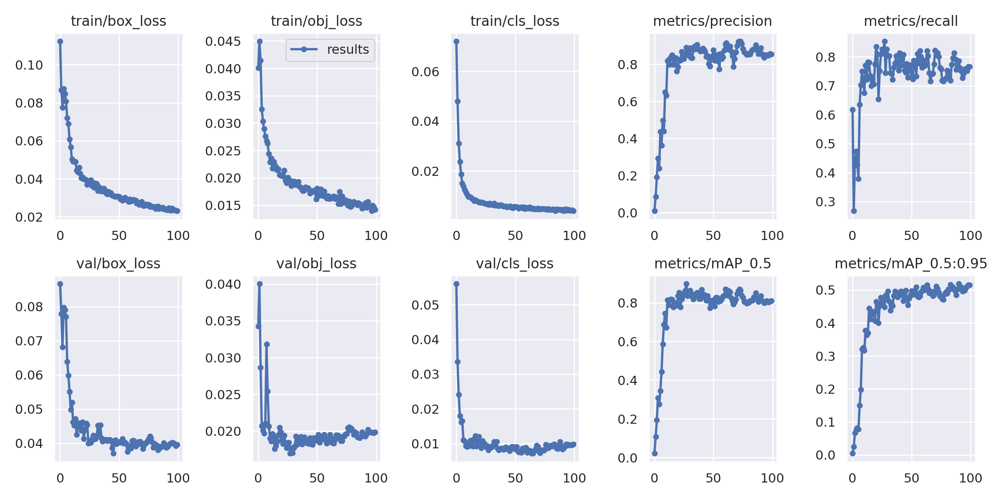

In [21]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/results.png', width = 1000)


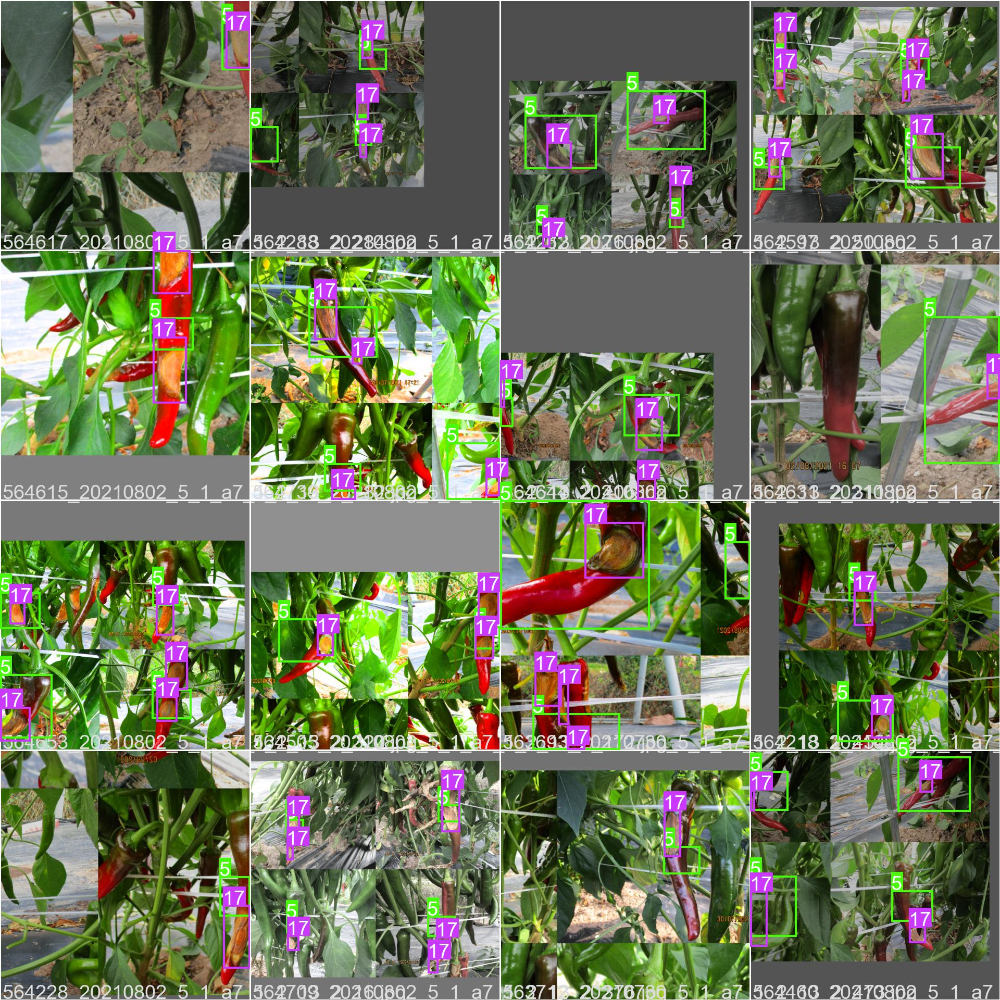

In [22]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/train_batch0.jpg', width = 1000)

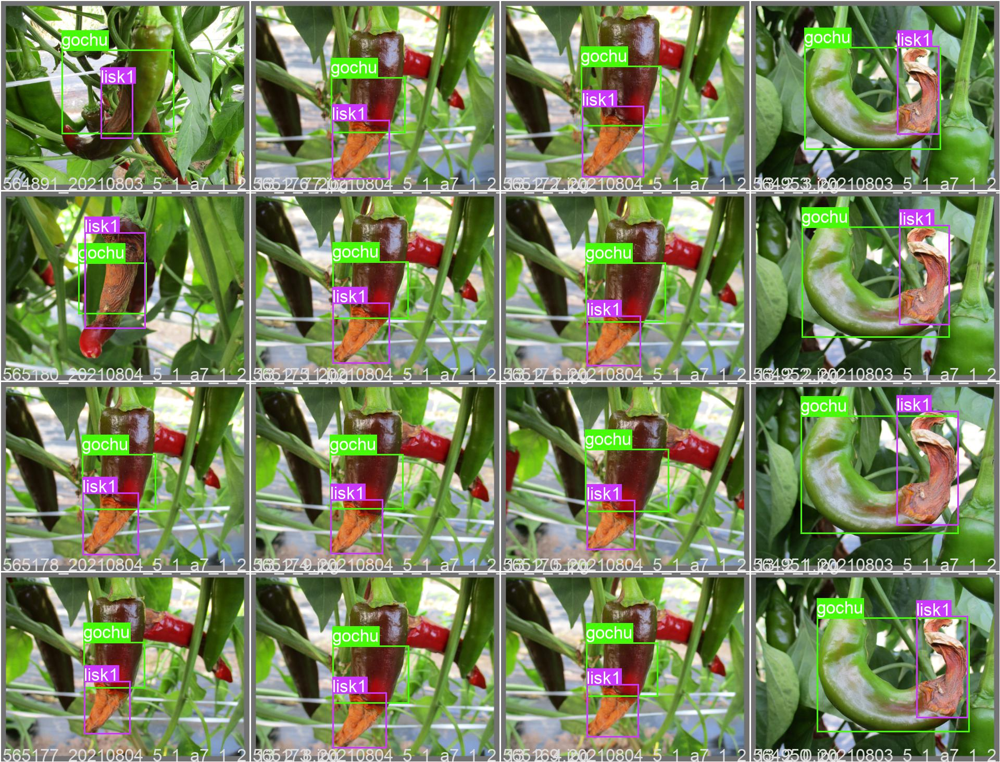

In [23]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/val_batch0_labels.jpg', width = 1000)

# 검증

In [24]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights/best.pt --data /content/drive/MyDrive/yolov5/data/gochu_500/data.yaml --img 640 --iou 0.65 --half

val: data=/content/drive/MyDrive/yolov5/data/gochu_500/data.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7061368 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning '/content/drive/MyDrive/yolov5/data/gochu_500/val/labels.cache' images and labels... 100 found, 0 missing, 0 empty, 0 corrupt: 100% 100/100 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:06<00:00,  1.52s/it]
                 all        100        234      0.889      0.785      0.829      0.517
            

In [25]:
# 지금까지 학습한 ..
%ls /content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights

best.pt  last.pt


In [26]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights/best.pt --data /content/drive/MyDrive/yolov5/data/gochu_500/data.yaml --img 640 --task test

val: data=/content/drive/MyDrive/yolov5/data/gochu_500/data.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7061368 parameters, 0 gradients, 15.9 GFLOPs
test: Scanning '/content/drive/MyDrive/yolov5/data/gochu_500/test/labels' images and labels...100 found, 0 missing, 0 empty, 0 corrupt: 100% 100/100 [01:09<00:00,  1.45it/s]
test: New cache created: /content/drive/MyDrive/yolov5/data/gochu_500/test/labels.cache
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:06<00:00,  1.62s/it]
       

# 추론

In [27]:
# best.pt를 쓰는게 낫죠
!python detect.py --weights /content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights/best.pt --img 640 --conf 0.4 --source /content/drive/MyDrive/yolov5/data/gochu_500/test/images
# test 이미지에 대해서 디텍션을 모두 사용한다. -> 

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights/best.pt'], source=/content/drive/MyDrive/yolov5/data/gochu_500/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-307-g92e47b8 Python-3.7.13 torch-1.12.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7061368 parameters, 0 gradients, 15.9 GFLOPs
image 1/100 /content/drive/MyDrive/yolov5/data/gochu_500/test/images/564786_20210802_5_1_a7_1_2_13_2_453.jpg: 480x640 1 gochu, 1 lisk1, Done. (0.013s)
image 2/100 /content/drive/MyDrive/yolov5/data/gochu_500/test/images/564787_20210802_5_1_a7_1_2_13_2_454.jpg: 480x640 1 gochu,

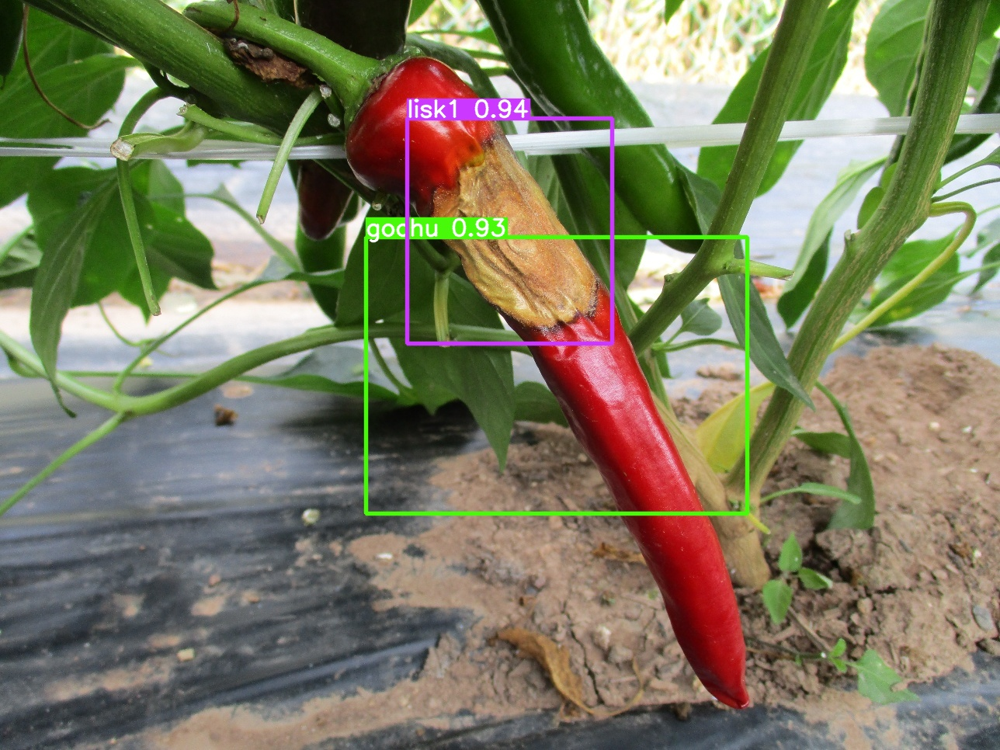

In [32]:
# 다 출력할 수는 없으니, 랜덤으로 !
import glob
import random
from IPython.display import Image, display

image_name = random.choice(glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp/*.jpg'))
display(Image(filename=image_name)) # 랜덤으로 이미지가 나온다 ! 학습을 더 많이 하면 더 좋은 결과 !

### 모델 내보내기

In [36]:
# 디렉토리 먼저 만들구
%mkdir /content/drive/MyDrive/yolov5/models/gochu_500

In [ ]:
# 만든 디렉토리에 모델 내보내
%cp /content/drive/MyDrive/yolov5/runs/train/gochu_500_results3/weights/best.pt /content/drive/MyDrive/yolov5/models/gochu_500